In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

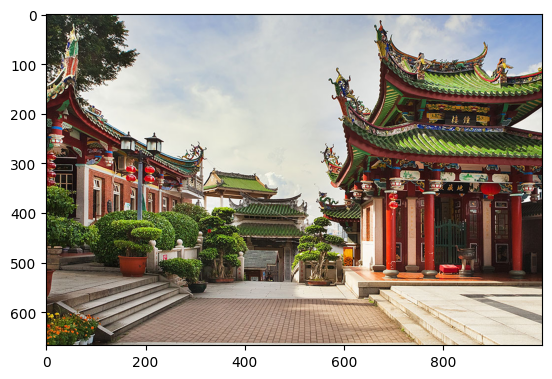

In [2]:
xiamen = cv2.cvtColor(cv2.imread("../Images/Xiamen.jpg"), cv2.COLOR_BGR2RGB)

plt.imshow(xiamen)
plt.show()


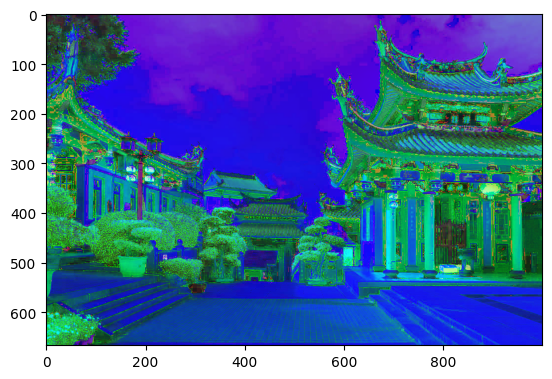

In [3]:
xiamen_hsv = cv2.cvtColor(cv2.imread("../Images/Xiamen.jpg"), cv2.COLOR_BGR2HSV)
plt.imshow(xiamen_hsv)
plt.show()

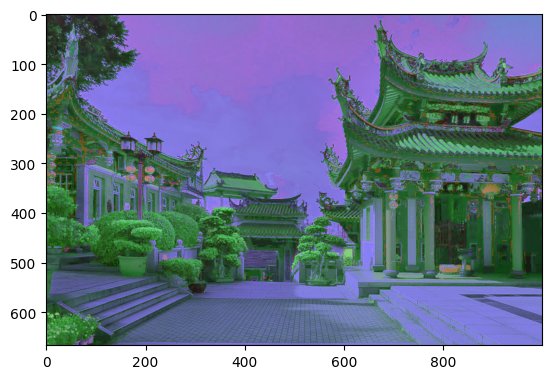

In [4]:
xiamen_blended = cv2.addWeighted(src1=xiamen, alpha=0.5, src2=xiamen_hsv, beta=0.5, gamma=0)
plt.imshow(xiamen_blended)
plt.show()

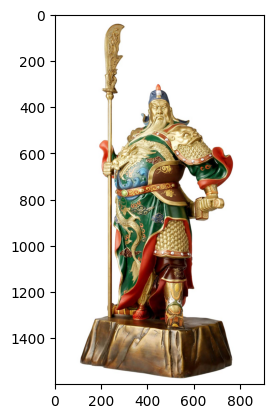

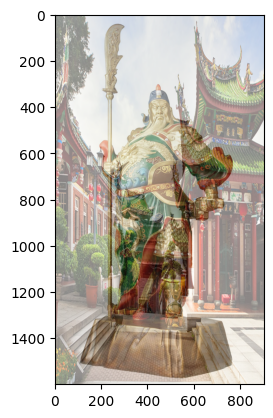

In [5]:
guan_yu = cv2.cvtColor(cv2.imread("../Images/guan_yu.jpg"), cv2.COLOR_BGR2RGB)
plt.imshow(guan_yu)
plt.show()

# Read and resize the images
xiamen_resized = cv2.resize(xiamen, (guan_yu.shape[1], guan_yu.shape[0]))

# Perform weighted addition
xiamen_guan_yu = cv2.addWeighted(src1=xiamen_resized, alpha=0.5, src2=guan_yu, beta=0.5, gamma=0)

# Display the result
plt.imshow(xiamen_guan_yu)
plt.show()

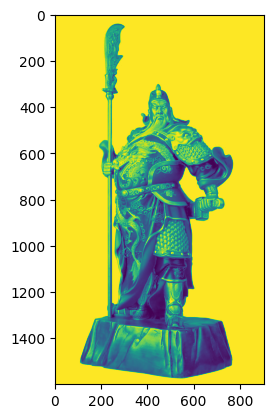

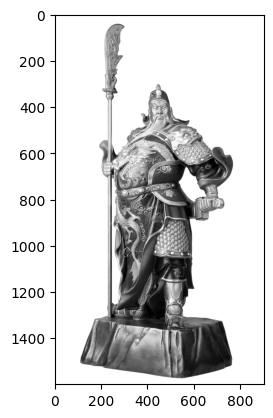

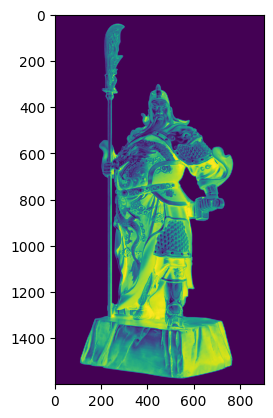

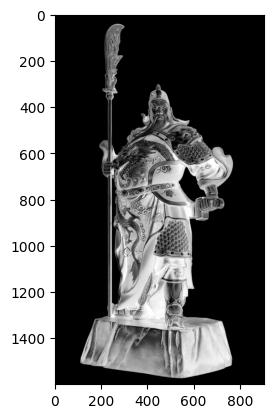

In [6]:
guan_yu_img2gray = cv2.cvtColor(guan_yu, cv2.COLOR_RGB2GRAY)
plt.imshow(guan_yu_img2gray)
plt.show()

plt.imshow(guan_yu_img2gray, cmap='gray')
plt.show()

mask_inv = cv2.bitwise_not(guan_yu_img2gray)
plt.imshow(mask_inv)
plt.show()

mask_inv = cv2.bitwise_not(guan_yu_img2gray)
plt.imshow(mask_inv, cmap='gray')
plt.show()


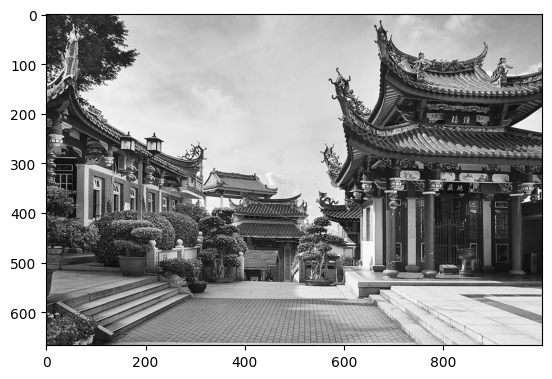

In [7]:
xiamen = cv2.imread("../Images/Xiamen.jpg", 0)
plt.imshow(xiamen, cmap='gray')
plt.show()

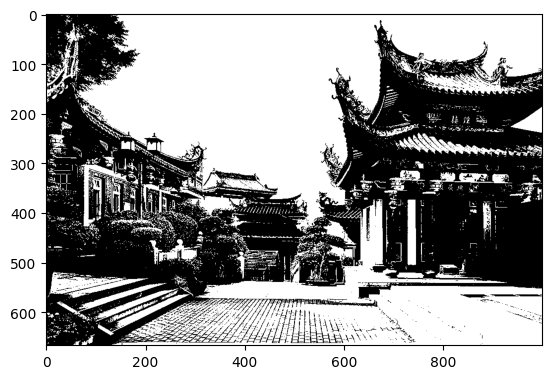

In [8]:
ret, thresh1 = cv2.threshold(xiamen, 127.5, 255, cv2.THRESH_BINARY)
plt.imshow(thresh1, cmap='gray')
plt.show()

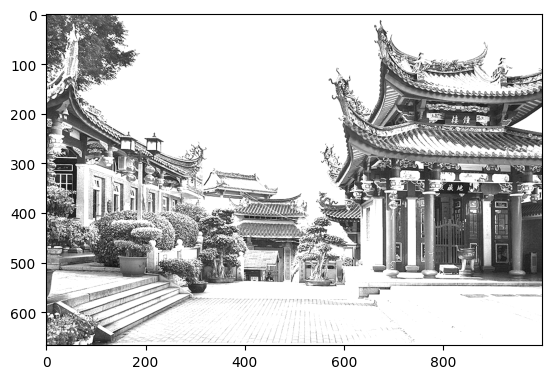

In [9]:
ret, thresh1 = cv2.threshold(xiamen, 127.5, 255, cv2.THRESH_TRUNC)
plt.imshow(thresh1, cmap='gray')
plt.show()

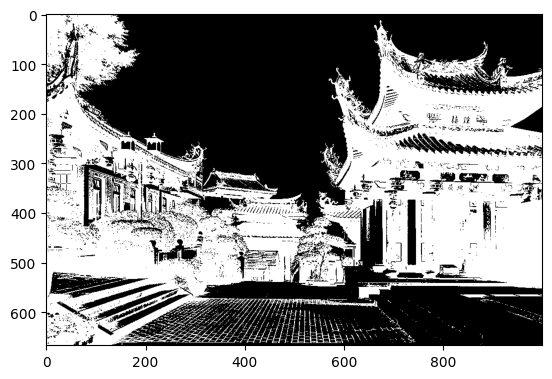

In [10]:
ret, thresh1 = cv2.threshold(xiamen, 127.5, 255, cv2.THRESH_BINARY_INV)
plt.imshow(thresh1, cmap='gray')
plt.show()

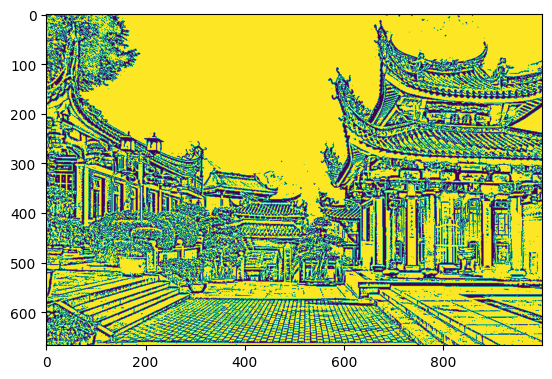

In [11]:
thresh2 = cv2.adaptiveThreshold(xiamen, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 8)
plt.imshow(thresh2)
plt.show()

## Blurring and Smoothing

- Often blurring and smoothing is combined with edge detection.

<img src=../Images/blurring_smoothing1.webp>
<img src=../Images/blurring_smoothing.png>


In [12]:
def load_img(img_path):
    img = cv2.imread(img_path).astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def display_img(img):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

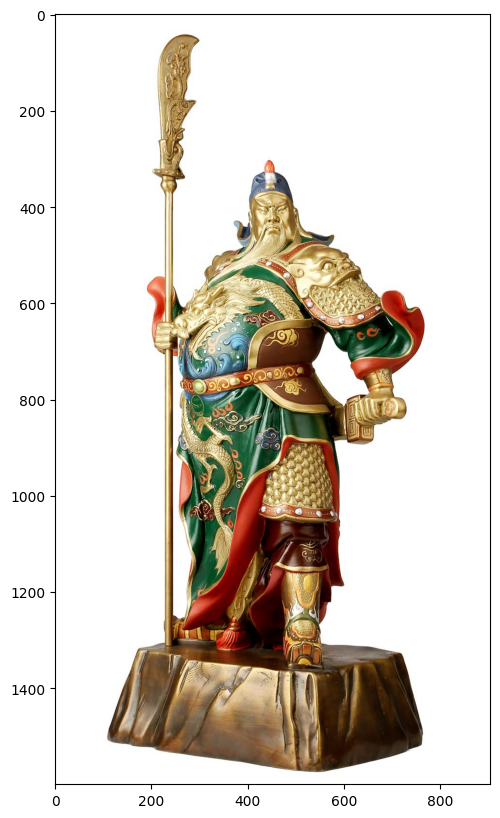

In [13]:
guan_yu = load_img("../Images/guan_yu.jpg")
display_img(guan_yu)

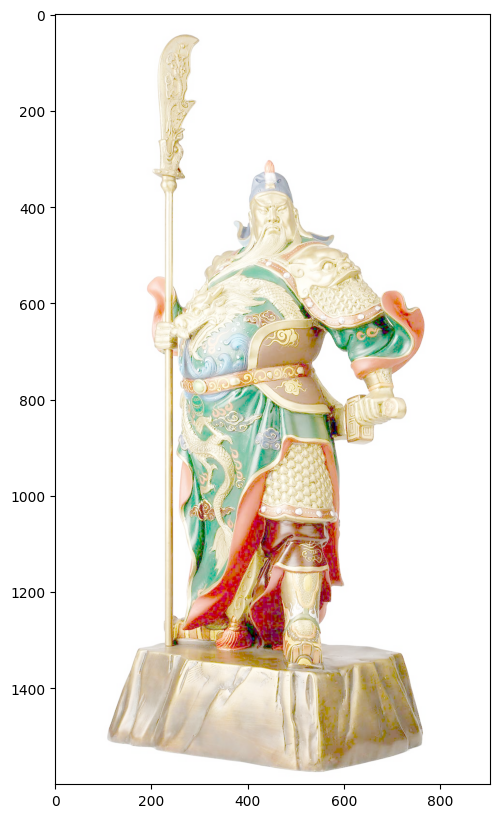

In [14]:
gamma = 1 /4

result = np.power(guan_yu, gamma)
display_img(result)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


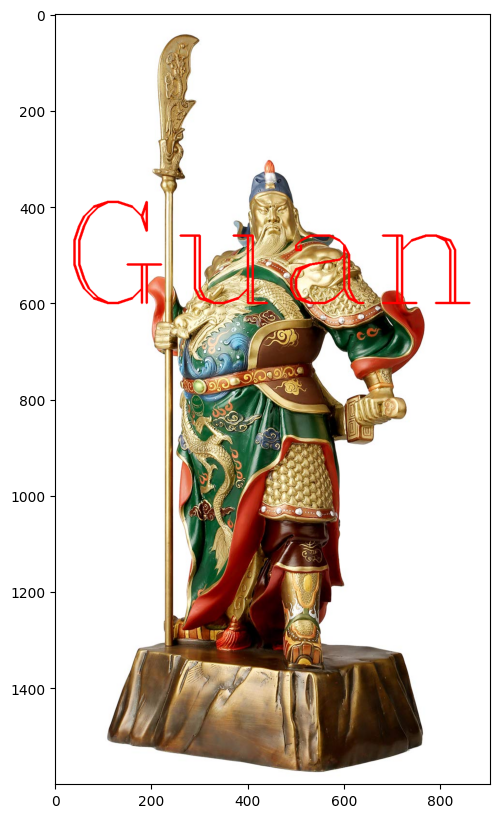

In [15]:
cv2.putText(guan_yu, text='Guan Yu', org=(10, 600), fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=10, color=(255,0,0), thickness=4)
display_img(guan_yu)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


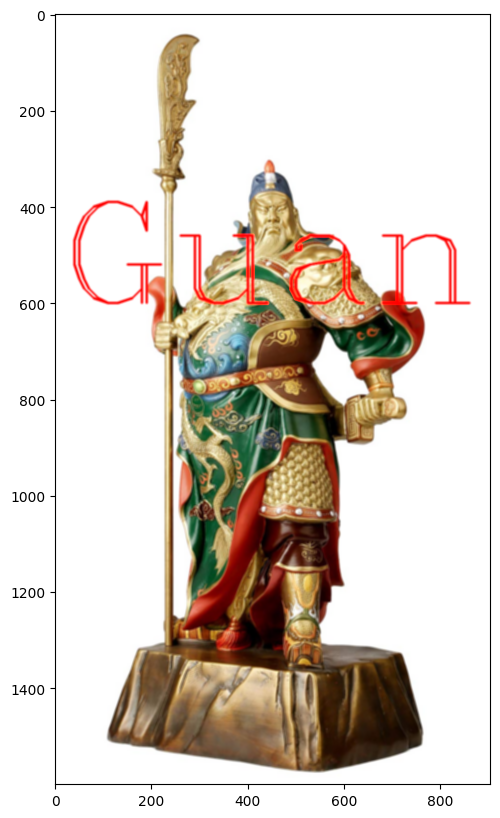

In [16]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 25

destination = cv2.filter2D(guan_yu, -1, kernel)
display_img(destination)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


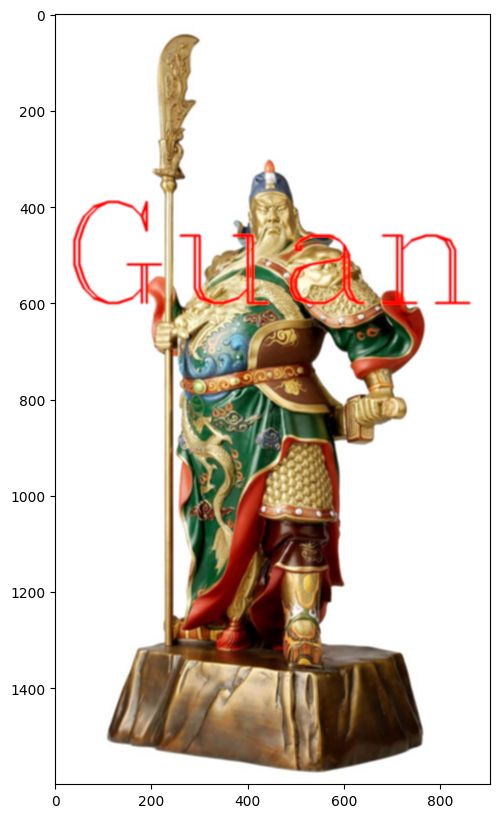

In [17]:
blurred = cv2.blur(guan_yu, ksize=(5, 5))
display_img(blurred)

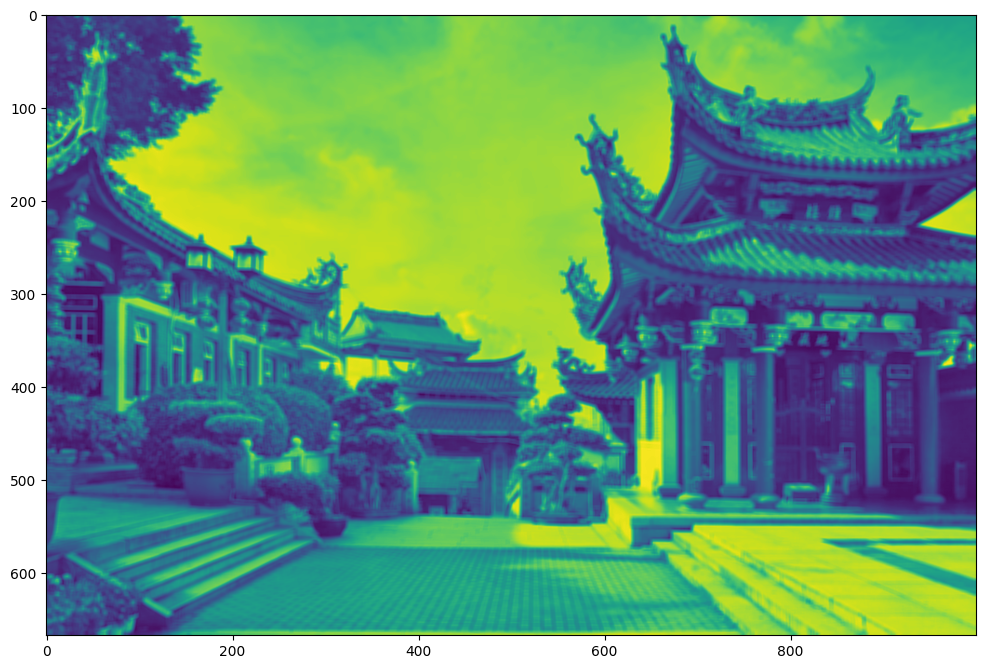

In [18]:
blurred_img = cv2.GaussianBlur(xiamen, (5, 5), 10)
display_img(blurred_img)

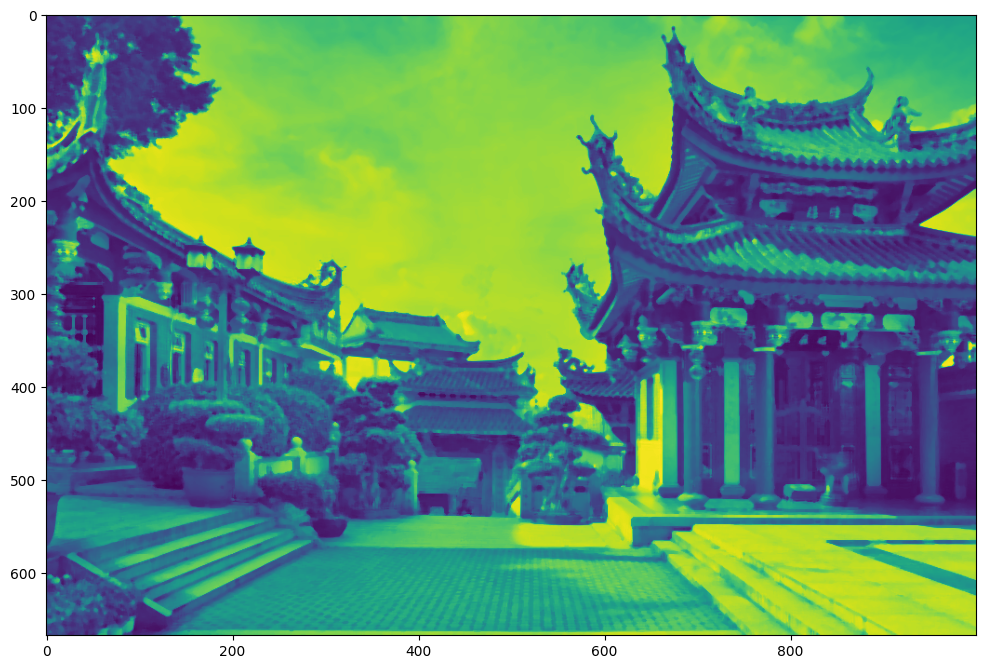

In [19]:
blurred_img = cv2.medianBlur(xiamen, 5)
display_img(blurred_img)

In [20]:
def load_img():
    blank_img = np.zeros((600, 600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img, text='ABCDE', org=(50, 300), fontFace=font, fontScale=5, color=(255, 255, 255))
    return blank_img

def display_img(img):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

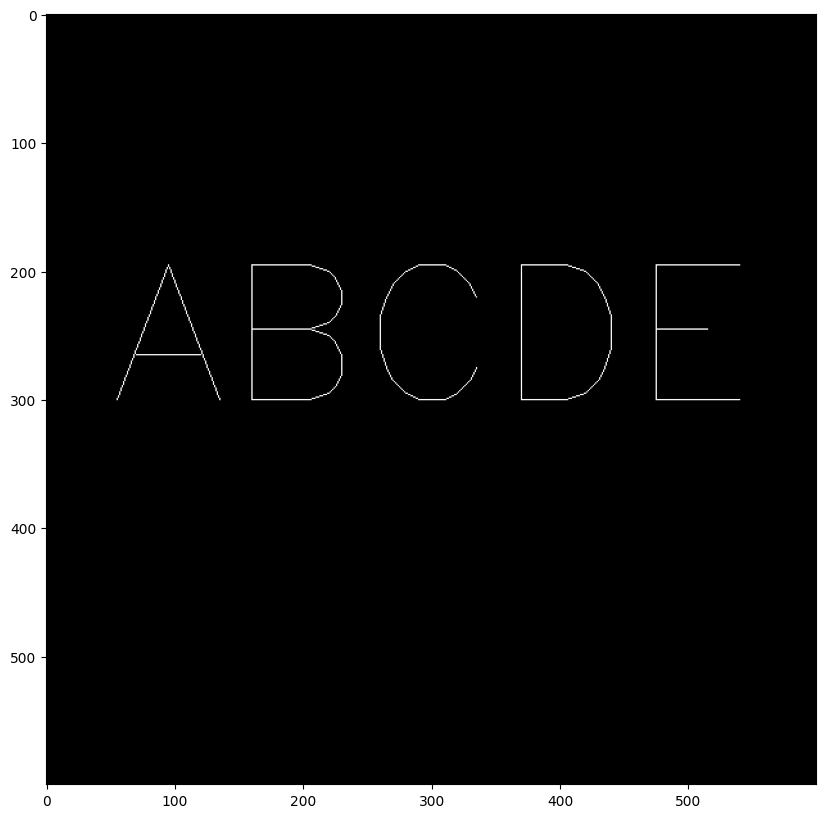

In [21]:
img = load_img()
display_img(img)

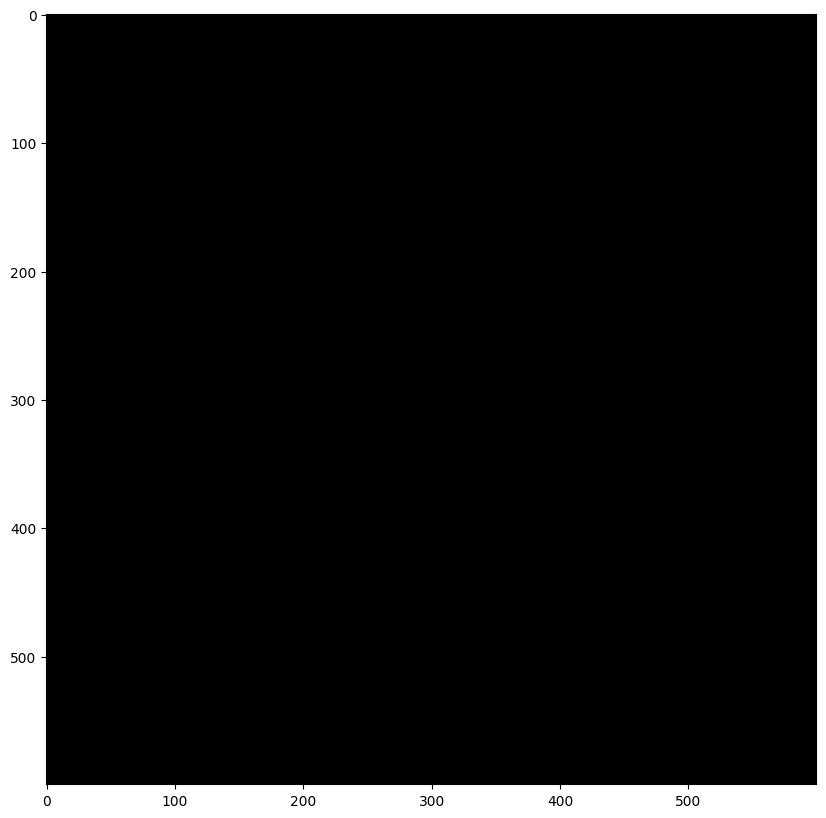

In [22]:
kernel = np.ones((5, 5), dtype=np.uint8)

result = cv2.erode(img, kernel, iterations=5)
display_img(result)

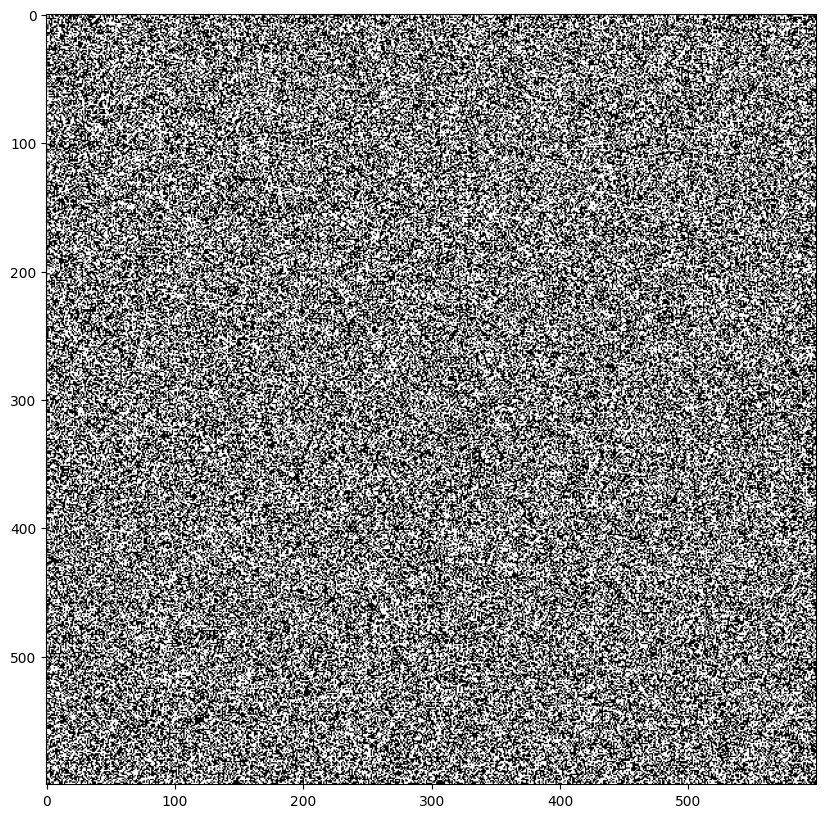

In [23]:
img = load_img()

white_noise = np.random.randint(low=0, high=2, size=(600, 600))
display_img(white_noise)

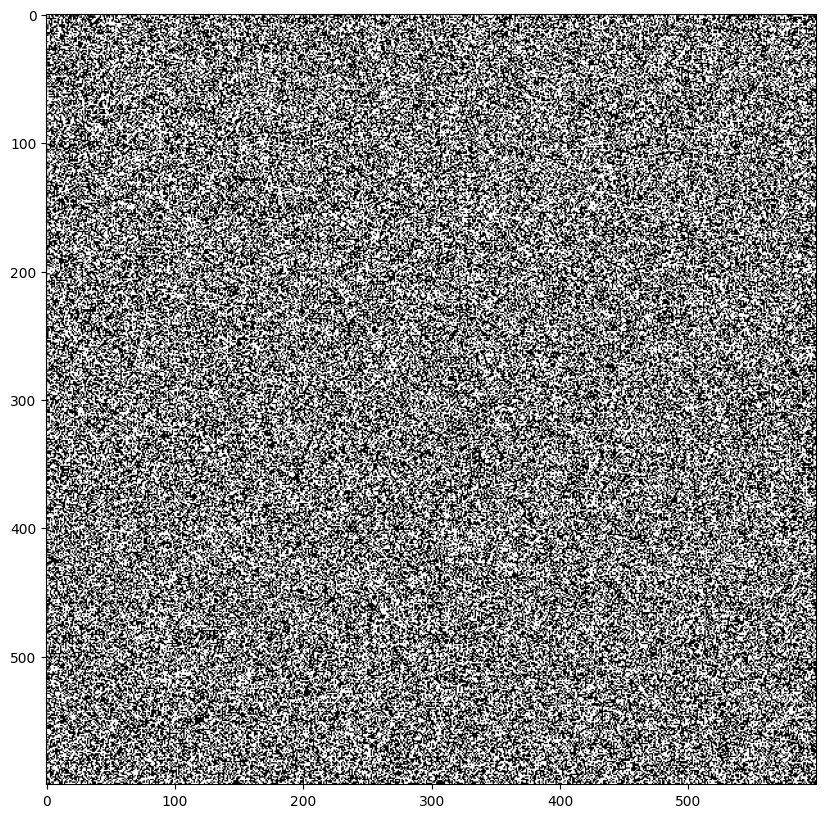

In [24]:
white_noise = white_noise * 255
display_img(white_noise)

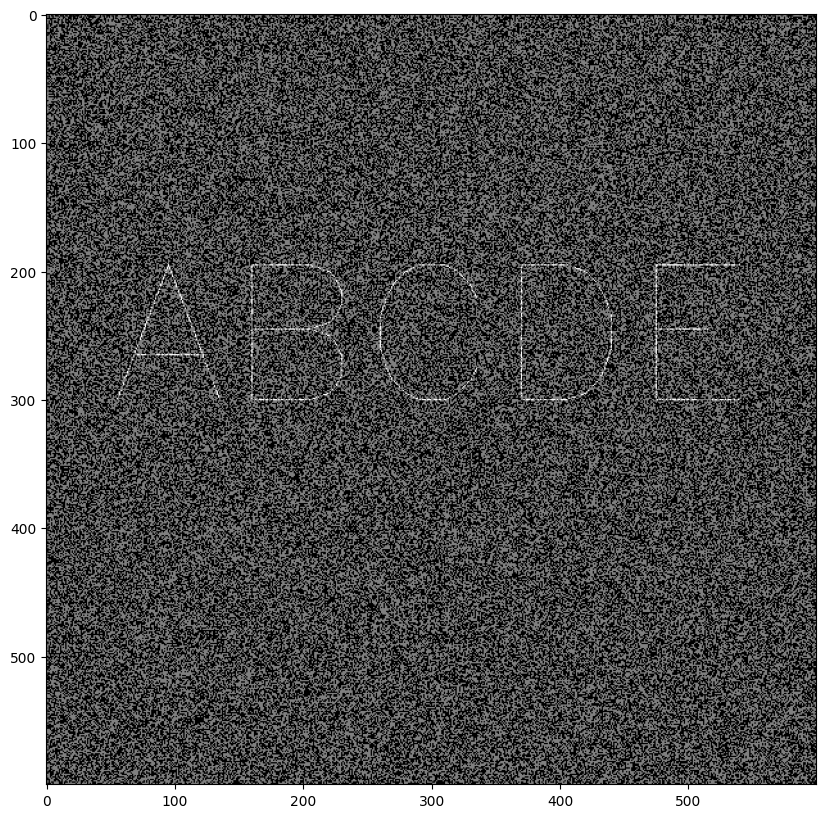

In [25]:
noise_img = white_noise + img
display_img(noise_img)

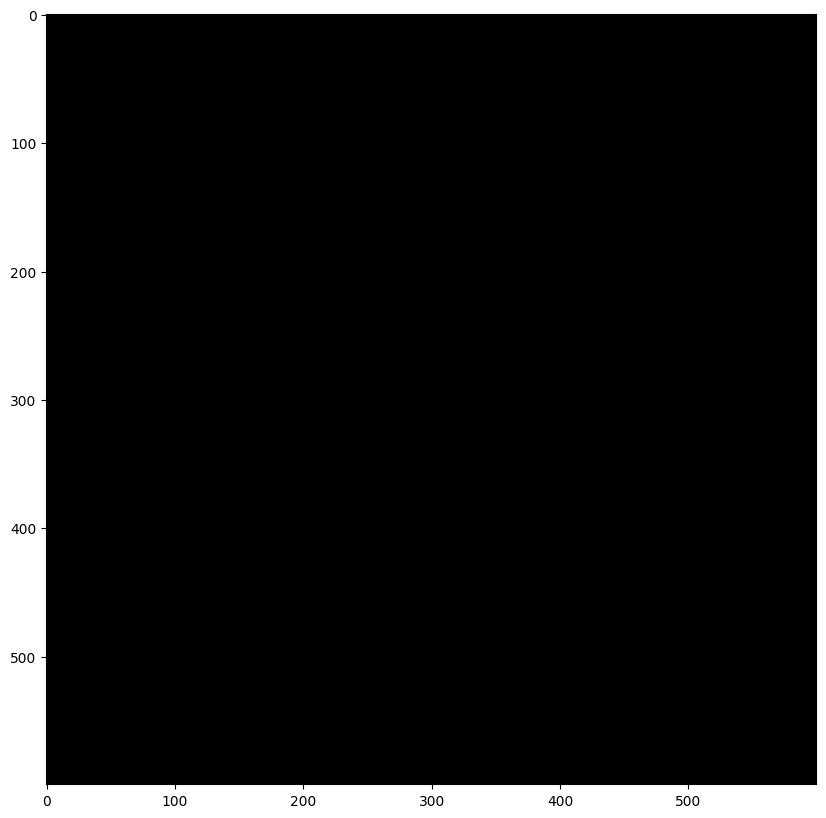

In [26]:
opening = cv2.morphologyEx(noise_img, cv2.MORPH_OPEN, kernel)

display_img(opening)

In [27]:
def show_image(img):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')
    plt.show()


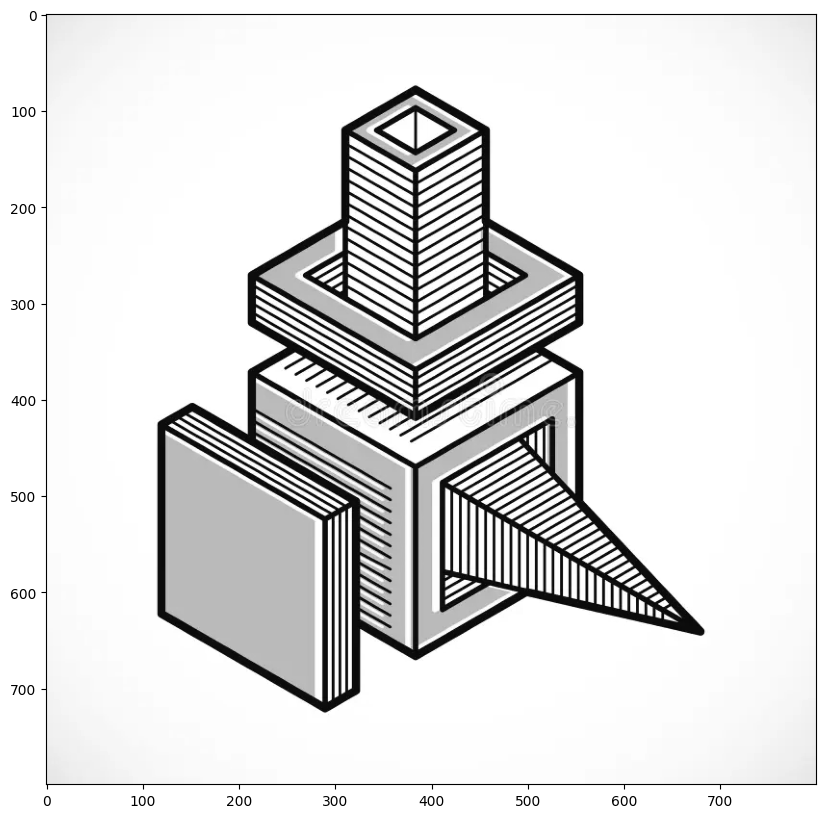

In [28]:
img = cv2.imread('../Images/three_d.webp', 0)
show_image(img)

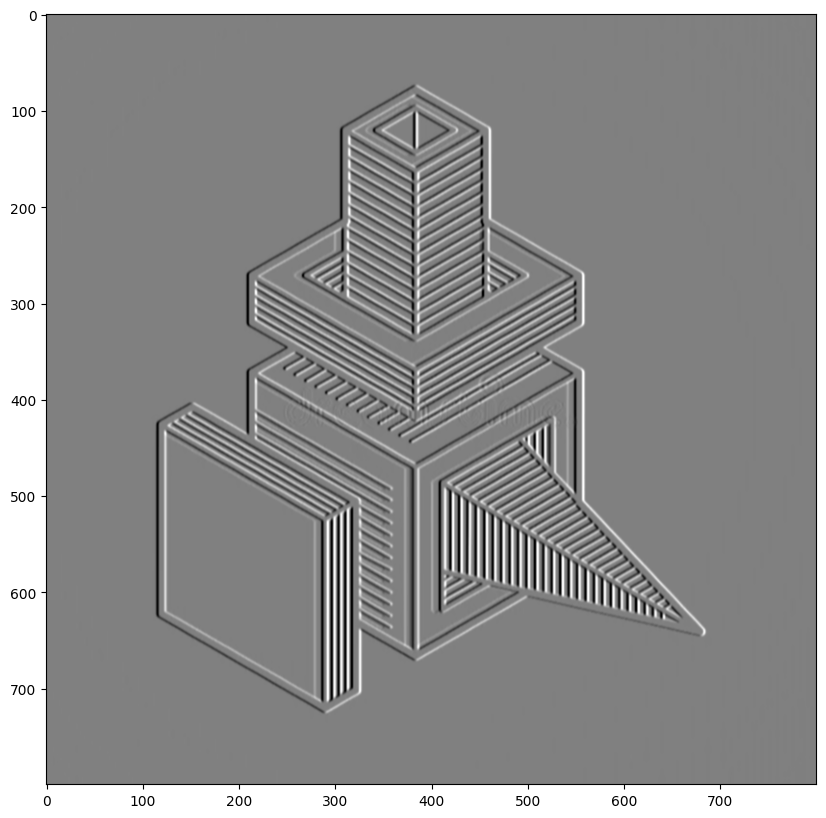

In [29]:
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
show_image(sobelx)

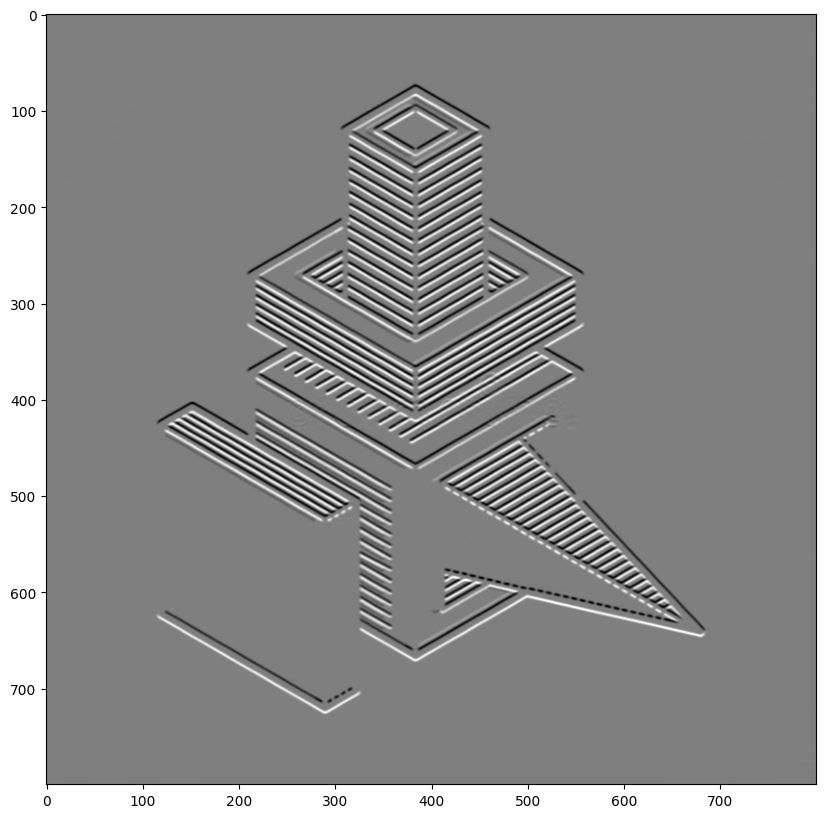

In [30]:
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
show_image(sobely)

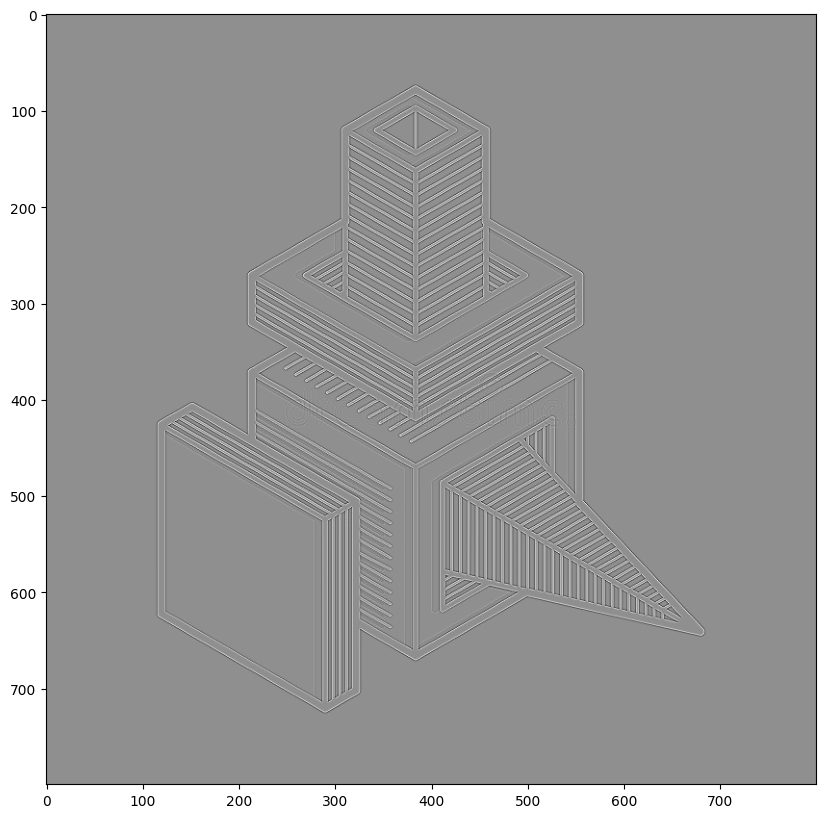

In [31]:
laplacian = cv2.Laplacian(img, cv2.CV_64F)
show_image(laplacian)

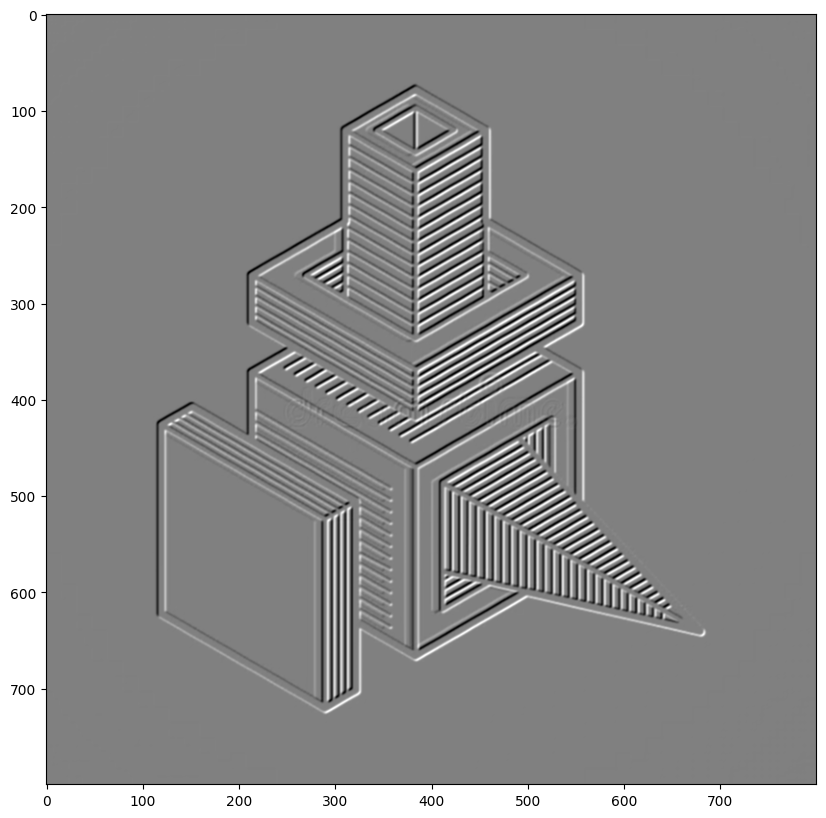

In [32]:
blended = cv2.addWeighted(src1=sobelx, alpha=0.5, src2=sobely, beta=0.5, gamma=0)
show_image(blended)

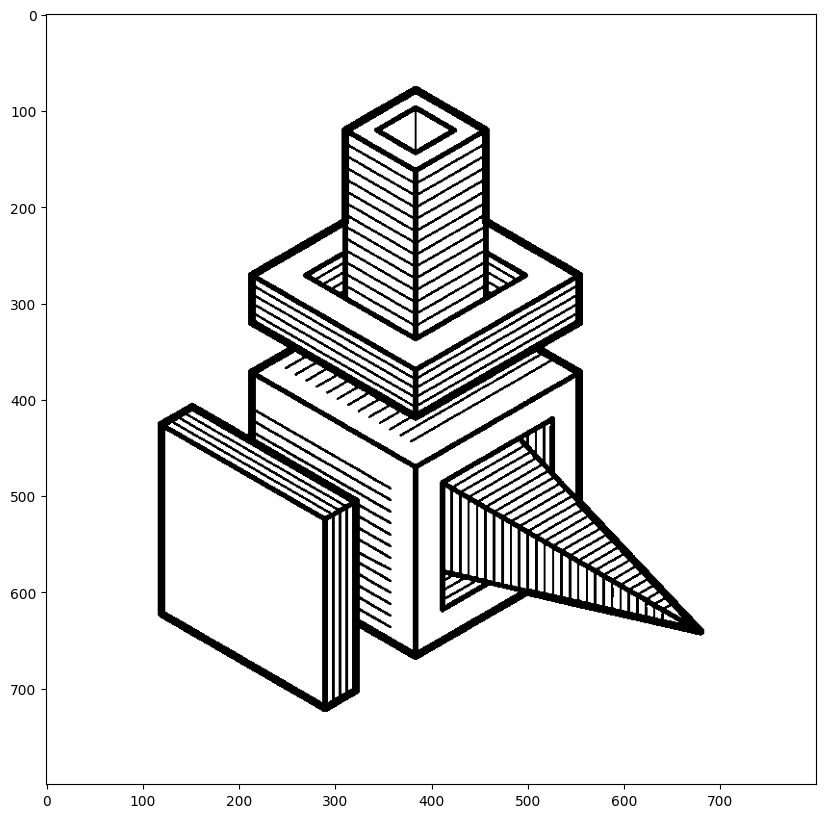

In [33]:
ret, th1 = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)
show_image(th1)

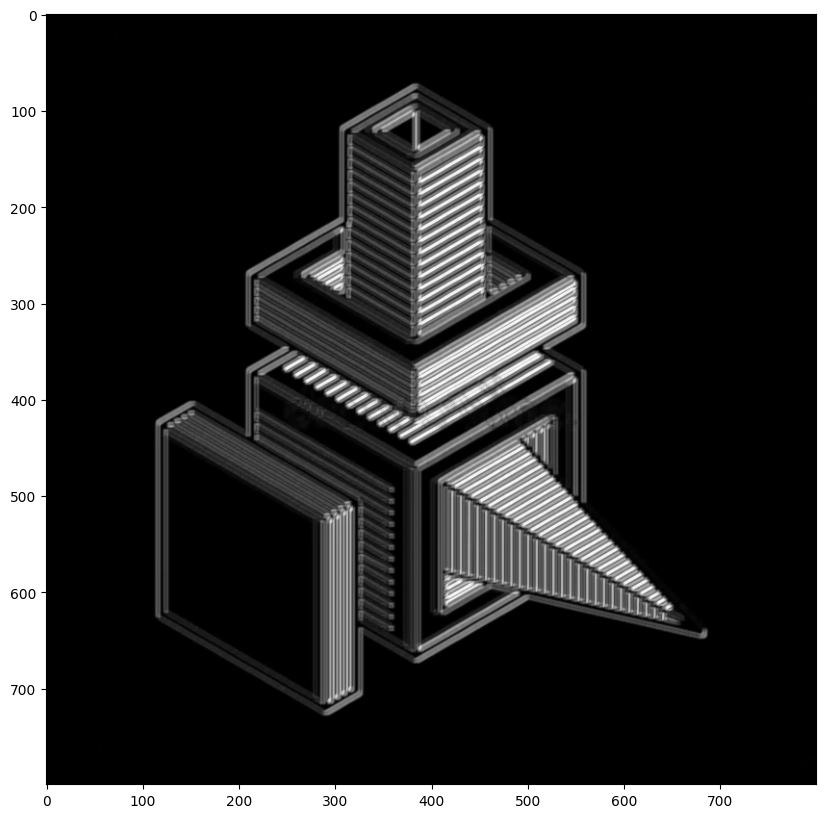

In [34]:
kernel = np.ones((4, 4), np.uint8)
gradient = cv2.morphologyEx(blended, cv2.MORPH_GRADIENT, kernel)
show_image(gradient)

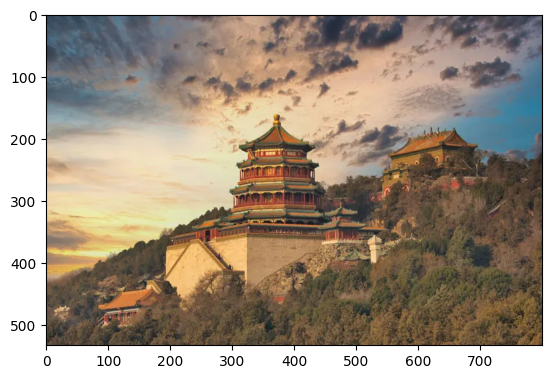

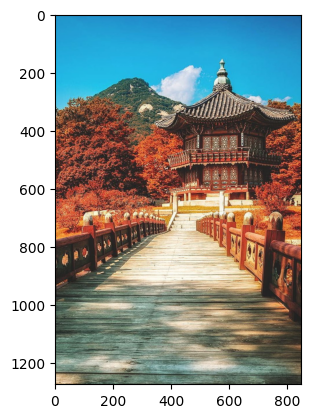

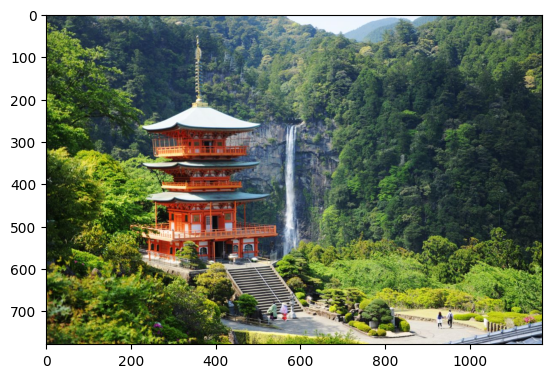

In [35]:
summer_palace = cv2.cvtColor(cv2.imread("../Images/summer_palace.webp"), cv2.COLOR_BGR2RGB)  
plt.imshow(summer_palace)
plt.show()

korea1 = cv2.cvtColor(cv2.imread("../Images/korea1.jpg"), cv2.COLOR_BGR2RGB)
plt.imshow(korea1)
plt.show()

kumano_kodo = cv2.cvtColor(cv2.imread("../Images/kumano_kodo.jpg"), cv2.COLOR_BGR2RGB) 
plt.imshow(kumano_kodo)
plt.show()

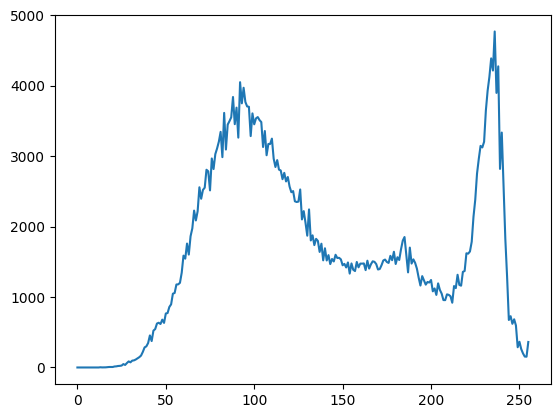

In [36]:
hist_values1 = cv2.calcHist([summer_palace], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(hist_values1)
plt.show()

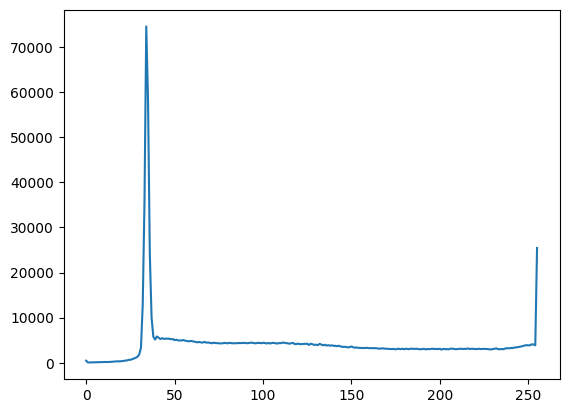

In [37]:
hist_values2 = cv2.calcHist([korea1], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(hist_values2)
plt.show()

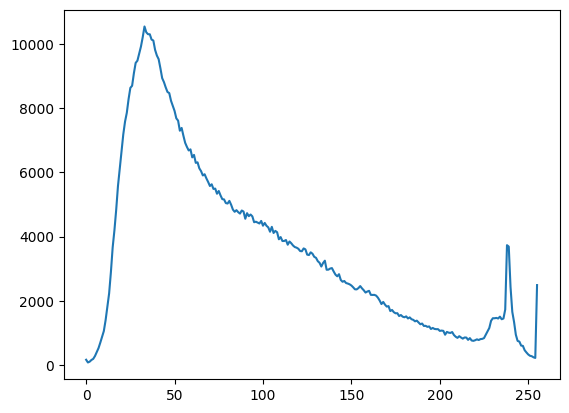

In [38]:
hist_values3 = cv2.calcHist([kumano_kodo], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(hist_values3)
plt.show()

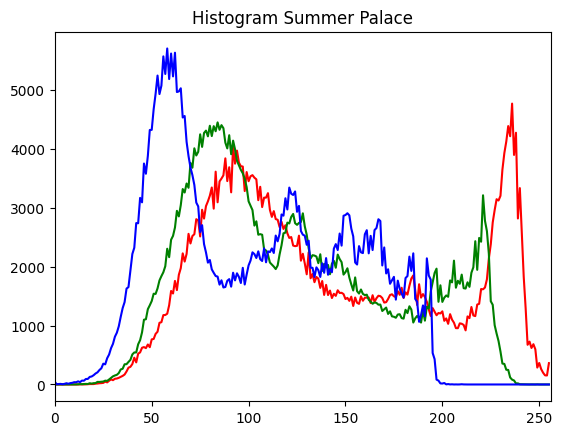

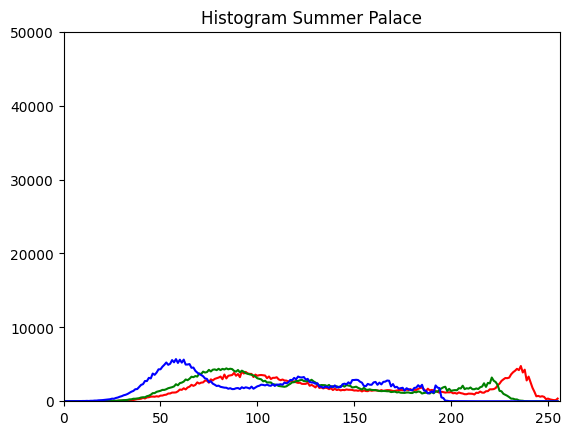

In [39]:
img = summer_palace

color = {'b', 'g', 'r'}

for i, col in enumerate(color):
    histr = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(histr, color=col)
    plt.xlim([0, 256])

    
plt.title('Histogram Summer Palace')
plt.show()

for i, col in enumerate(color):
    histr = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(histr, color=col)
    plt.xlim([0, 256])
    plt.ylim([0, 50000])
    
    
plt.title('Histogram Summer Palace')
plt.show()

summer_palace.shape: (533, 800, 3)
summer_palace rows and columns: (533, 800)


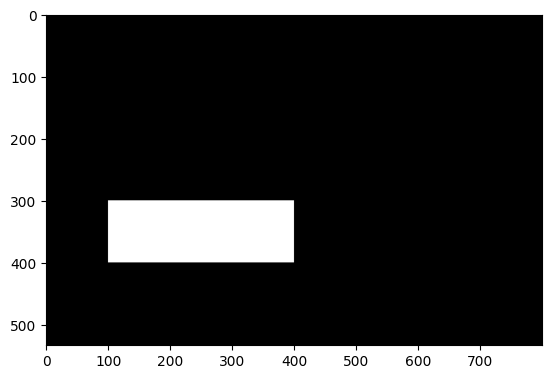

In [54]:
print("summer_palace.shape:", summer_palace.shape)
print("summer_palace rows and columns:", summer_palace.shape[:2])

masked_summer_palace = np.zeros(summer_palace.shape[:2], np.uint8)

plt.imshow(masked_summer_palace, cmap='gray')
masked_summer_palace[300:400, 100:400] = 255
plt.imshow(masked_summer_palace, cmap='gray')